# Project 1 R Notebook Data Story

Qian Zhang, qz2416

In [1]:
# python version
!python --version

Python 3.7.2


In [2]:
# install packages
!pip install nltk
!pip install collections
!pip install vaderSentiment
!pip install twython
!pip install rake_nltk
!pip install wordCloud

cryptography 3.3.1 has requirement cffi>=1.12, but you'll have cffi 1.11.5 which is incompatible.
You are using pip version 10.0.1, however version 21.2.4 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.
  Could not find a version that satisfies the requirement collections (from versions: )
No matching distribution found for collections
You are using pip version 10.0.1, however version 21.2.4 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.
cryptography 3.3.1 has requirement cffi>=1.12, but you'll have cffi 1.11.5 which is incompatible.
You are using pip version 10.0.1, however version 21.2.4 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.
cryptography 3.3.1 has requirement cffi>=1.12, but you'll have cffi 1.11.5 which is incompatible.
You are using pip version 10.0.1, however version 21.2.4 is available.
You should consider upgrading via the 'pip install --upgrade p

In [3]:
# import libraries or download packages
import nltk
nltk.download("vader_lexicon")
nltk.download('stopwords')
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from rake_nltk import Rake
from collections import Counter
from wordcloud import WordCloud, STOPWORDS
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/apple/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package stopwords to /Users/apple/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Last term, I needed some papers that supporting my statements when I was writing a report for a course project. At that time, I had to spend lots of time reading papers. It is extremely time-consuming and I believe I would face the same situation again in the future. I am wondering how to make this process of checking content and attitudes more effective.

## Question:  What materials should I choose for my report?

First, I come up with a scientific question:
## Scientific Question: Which material talks about my topic and supports my opinion?
The correct answer to this question, in the ideal situation, is to read all the materials I can find to see authors' opinions. Then I will choose those that supports my arguments. <br>
However, it is unrealistic if there are thousthands of papers or textbooks.

## Data
Now we are given the philosophy dataset.

In [4]:
# read csv file
df = pd.read_csv (
    r'/Users/apple/Fall2021-Project1-QianZhang-Erica/data/philosophy_data.csv')

Let's take a look at the data:

In [5]:
# check for null values
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 360808 entries, 0 to 360807
Data columns (total 11 columns):
title                        360808 non-null object
author                       360808 non-null object
school                       360808 non-null object
sentence_spacy               360808 non-null object
sentence_str                 360808 non-null object
original_publication_date    360808 non-null int64
corpus_edition_date          360808 non-null int64
sentence_length              360808 non-null int64
sentence_lowered             360808 non-null object
tokenized_txt                360808 non-null object
lemmatized_str               360808 non-null object
dtypes: int64(3), object(8)
memory usage: 30.3+ MB


In [6]:
# display part of the data
df[0:10]

,title,author,school,sentence_spacy,sentence_str,original_publication_date,corpus_edition_date,sentence_length,sentence_lowered,tokenized_txt,lemmatized_str
0,Plato - Complete Works,Plato,plato,"What's new, Socrates, to make you leave your ...","What's new, Socrates, to make you leave your ...",-350,1997,125,"what's new, socrates, to make you leave your ...","['what', 'new', 'socrates', 'to', 'make', 'you...","what be new , Socrates , to make -PRON- lea..."
1,Plato - Complete Works,Plato,plato,Surely you are not prosecuting anyone before t...,Surely you are not prosecuting anyone before t...,-350,1997,69,surely you are not prosecuting anyone before t...,"['surely', 'you', 'are', 'not', 'prosecuting',...",surely -PRON- be not prosecute anyone before ...
2,Plato - Complete Works,Plato,plato,The Athenians do not call this a prosecution b...,The Athenians do not call this a prosecution b...,-350,1997,74,the athenians do not call this a prosecution b...,"['the', 'athenians', 'do', 'not', 'call', 'thi...",the Athenians do not call this a prosecution ...
3,Plato - Complete Works,Plato,plato,What is this you say?,What is this you say?,-350,1997,21,what is this you say?,"['what', 'is', 'this', 'you', 'say']",what be this -PRON- say ?
4,Plato - Complete Works,Plato,plato,"Someone must have indicted you, for you are no...","Someone must have indicted you, for you are no...",-350,1997,101,"someone must have indicted you, for you are no...","['someone', 'must', 'have', 'indicted', 'you',...","someone must have indict -PRON- , for -PRON- ..."
5,Plato - Complete Works,Plato,plato,But someone else has indicted you?,But someone else has indicted you?,-350,1997,34,but someone else has indicted you?,"['but', 'someone', 'else', 'has', 'indicted', ...",but someone else have indict -PRON- ?
6,Plato - Complete Works,Plato,plato,"I do not really know him myself, Euthyphro.","I do not really know him myself, Euthyphro.",-350,1997,43,"i do not really know him myself, euthyphro.","['do', 'not', 'really', 'know', 'him', 'myself...","-PRON- do not really know -PRON- -PRON- , Eut..."
7,Plato - Complete Works,Plato,plato,He is apparently young and unknown.,He is apparently young and unknown.,-350,1997,35,he is apparently young and unknown.,"['he', 'is', 'apparently', 'young', 'and', 'un...",-PRON- be apparently young and unknown .
8,Plato - Complete Works,Plato,plato,"They call him Meletus, I believe.","They call him Meletus, I believe.",-350,1997,33,"they call him meletus, i believe.","['they', 'call', 'him', 'meletus', 'believe']","-PRON- call -PRON- Meletus , -PRON- believe ."
9,Plato - Complete Works,Plato,plato,"He belongs to the Pitthean deme, if you know a...","He belongs to the Pitthean deme, if you know a...",-350,1997,147,"he belongs to the pitthean deme, if you know a...","['he', 'belongs', 'to', 'the', 'pitthean', 'de...","-PRON- belong to the Pitthean deme , if -PRON..."


It contains 360,808 sentences from over 50 texts spanning 13 schools of philosophy. According to the output, there are no null values. <br>
By the data given, I come up with a method to analyze the data to answer the scientific question. The current dataframe is what I need for my method, so there isn't any preprocessing.

## Tools used: Sentiment Analysis and Keyword Extraction
Sentiment analysis uses natural language processing techniques to detect positive, negative or neutral attitude in a text. <br>
Keyword extraction is a technique that extracts the most used and most important words in a text. <br>
In this project, I use package vaderSentiment to do a sentiment analysis since this is the method used for unlabelled text data (the texts are not labelled as 'positive', 'negative' or 'neutral', so they are unlabelled). <br>
For keyword extraction, package rake_nltk is used since it is more flexible as we are able to control the number of words in keywords using this package. For example, we can have a keyword "data science" or "advanced data science". <br>

## Method
In the method, I treat these sentences by schools. <br>
First, I will do a sentiment analysis on every sentence for one school to see if the author's attitude is positive, negative or neutral. At the same time, I will do a keyword extraction on each text. As a result, I am able to get percentages of positive, negative and neutral attitudes and keywords for positive, negative and neutral attitudes in that particular school. Then, I will repeat this process on every school. In this way, I am able to check which school has texts that are related to my topic and whether the texts supports my arguments.

## Code

In [7]:
# set plot size
plt.rcParams['figure.figsize'] = [14, 12]
# Create stopword list:
stopw = set(STOPWORDS)

In [8]:
# decide threshold of attitudes
def classify_sentiment(vds_res):
    if vds_res['compound'] >= 0.05:
        return "pos"
    elif vds_res['compound'] <= -0.05:
        return "neg"
    else:
        return "neu"

In [9]:
# count numbers of positive, negative and neutral, and extract keywords
def each_school(df_school):
    num_pos = 0
    num_neg = 0
    num_neu = 0
    
    kw_pos = []
    kw_neg = []
    kw_neu = []

    # use sentence_lowere
    for i in range (len(df_school)):
        res = classify_sentiment((vds.polarity_scores(df_school['sentence_lowered'].iloc[i])))
        if res == "pos":
            num_pos += 1
            rn.extract_keywords_from_text(df_school['sentence_lowered'].iloc[i])
            kw_pos.extend(rn.get_ranked_phrases())
        elif res == "neg":
            num_neg += 1
            rn.extract_keywords_from_text(df_school['sentence_lowered'].iloc[i])
            kw_neg.extend(rn.get_ranked_phrases())
        else:
            num_neu += 1
            rn.extract_keywords_from_text(df_school['sentence_lowered'].iloc[i])
            kw_neu.extend(rn.get_ranked_phrases())
    return [num_pos, num_neg, num_neu], kw_pos, kw_neg, kw_neu

In [10]:
# count frequencies of each keyword
def count_freq(dict_per_school):
    freq_dict_pos = dict(Counter(dict_per_school[0]))
    freq_dict_neg = dict(Counter(dict_per_school[1]))
    freq_dict_neu = dict(Counter(dict_per_school[2]))
    return freq_dict_pos, freq_dict_neg, freq_dict_neu

In [11]:
# draw pie chart
def draw_pie(school_name):
    plt.figure(figsize=(8,8))
    plt.pie(df_plot_per.loc[school_name,],
        autopct='%1.1f%%', 
            labels=['Positive', 'Negative', 'Neutral'], 
            explode=(0.02, 0.02, 0.02), 
            colors=['#ff9999','#66b3ff','#99ff99','#ffcc99'])

In [12]:
# draw word cloud
def draw_cloud(school_key_dict):
    po, ne, nu = count_freq(school_key_dict)
    w1 = WordCloud(stopwords=stopw, collocations=False).generate_from_frequencies(po)
    plt.imshow(w1, interpolation = 'bilinear')
    plt.axis("off")
    plt.title('Word Cloud - Positive')
    plt.show()
    w2 = WordCloud(stopwords=stopw, collocations=False).generate_from_frequencies(ne)
    plt.imshow(w2, interpolation = 'bilinear')
    plt.axis("off")
    plt.title('Word Cloud - Negative')
    plt.show()
    w3= WordCloud(stopwords=stopw, collocations=False).generate_from_frequencies(nu)
    plt.imshow(w3, interpolation = 'bilinear')
    plt.axis("off")
    plt.title('Word Cloud - Neutral')
    plt.show()

In [13]:
# sentiment analysis
vds = SentimentIntensityAnalyzer()

# keyword extraction
rn = Rake()

# find names of those schools
school_list = df['school'].unique()

# generate results
res_dict = {}
key_dict = {}
for i in school_list:
    df_school = df[df['school'] == i]
    res = each_school(df_school)
    res_dict[i] = res[0]
    key_dict[i] = [res[1], res[2], res[3]]

## Plots

In [14]:
# transform the results for plotting graphs
df_plot = pd.DataFrame.from_dict(
    res_dict,orient='index', columns = ['Positive', 'Negative', 'Neutral'])
df_plot.index.name = 'School'
df_plot.reset_index(inplace=True)
df_plot_t = df_plot["Positive"] + df_plot["Negative"] + df_plot["Neutral"]
df_plot_per = df_plot[df_plot.columns[1:]].div(df_plot_t, 0)*100

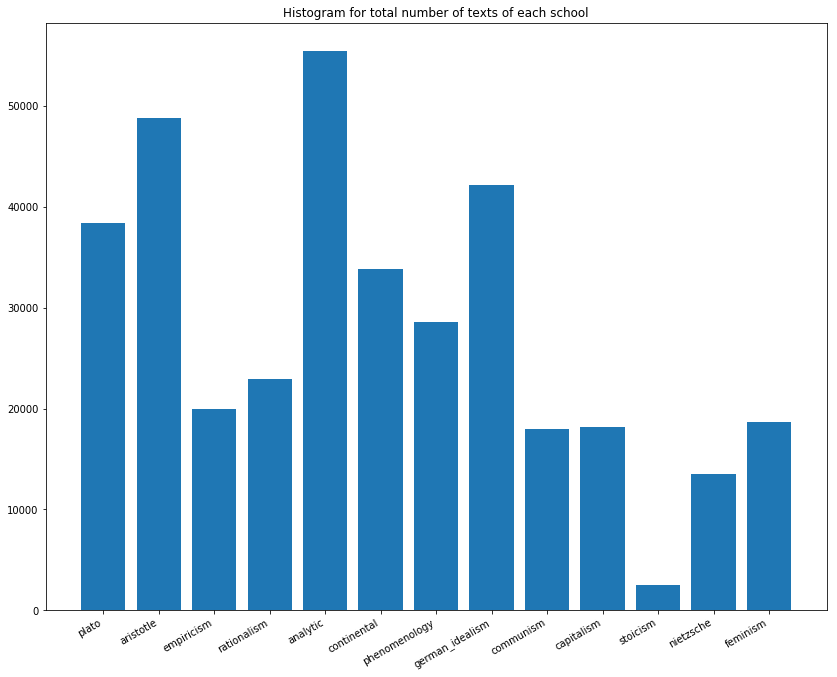

In [15]:
# histogram
fig, ax = plt.subplots()
plt.bar(school_list, df_plot_t)
plt.title('Histogram for total number of texts of each school')
fig.autofmt_xdate()

This plot shows the total number of texts in each school. We can see stoicism has relatively small amount of texts.

<Figure size 864x864 with 0 Axes>

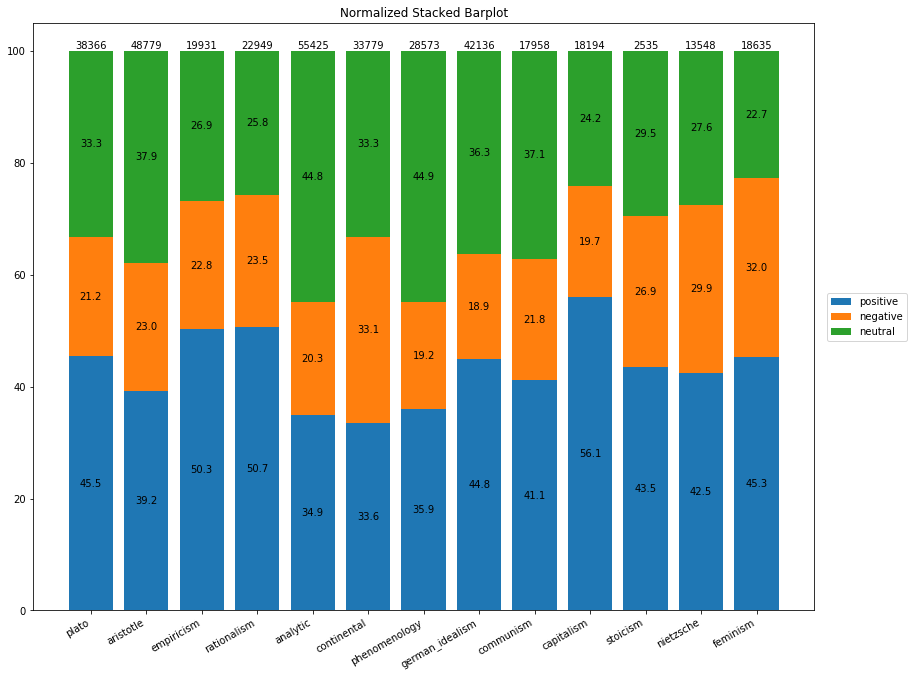

In [16]:
# Normalized Stacked Barplot
plt.figure(figsize=(12,12))
fig, ax = plt.subplots()

names = school_list
positive = df_plot_per['Positive']
negative = df_plot_per['Negative']
neutral = df_plot_per['Neutral']

# stack bars
plt.bar(names, positive, label='positive')
plt.bar(names, negative, bottom=positive,label='negative')
plt.bar(names, neutral, bottom=positive+negative, label='neutral')

# add percentage
for xs, ys, yval in zip(names, positive/2, positive):
    plt.text(xs, ys, "%.1f"%yval, ha="center", va="center")
for xs, ys, yval in zip(names, positive+negative/2, negative):
    plt.text(xs, ys, "%.1f"%yval, ha="center", va="center")
for xs, ys, yval in zip(names, positive+negative+neutral/2, neutral):
    plt.text(xs, ys, "%.1f"%yval, ha="center", va="center")
# add total
for xs, ys, yval in zip(names, positive+negative+neutral, df_plot_t):
    plt.text(xs, ys, yval, ha="center", va="bottom")
    
plt.title("Normalized Stacked Barplot")
fig.autofmt_xdate()
plt.legend(bbox_to_anchor=(1.01,0.5), loc='center left')

This plots shows the percentage of positive, negative and neutral attitudes for texts in each school. The number above the bar is total number of texts in that particular school. <br>
This plot provides lots of information. For example, capitalism has the highest percentage of positive attitudes; feminism has the highest percentage of negative attitudes; phenomenology has the highest percentage of neutral attitudes. Lots of comparsions can be made here.

In [17]:
# transform data for plotting
df_plot_per.index = school_list

## Pie Chart and Word Cloud for each school

# plato

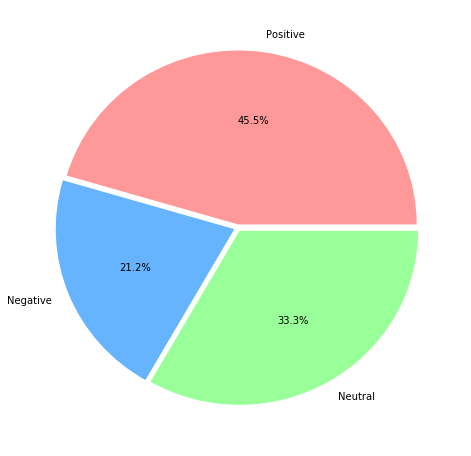

In [18]:
draw_pie('plato')

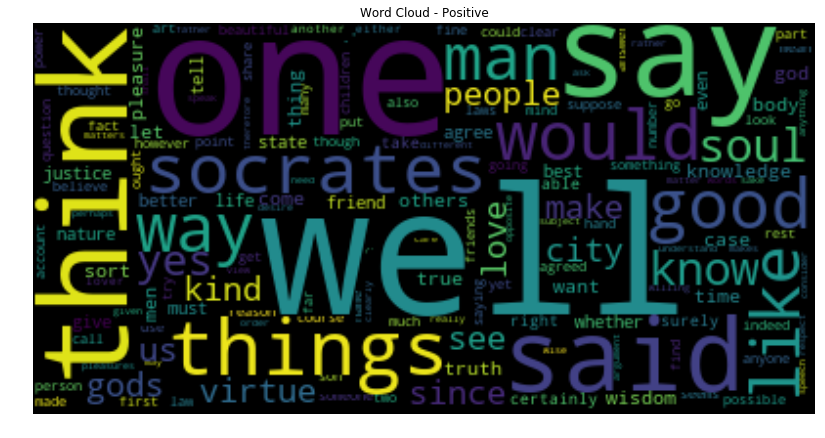

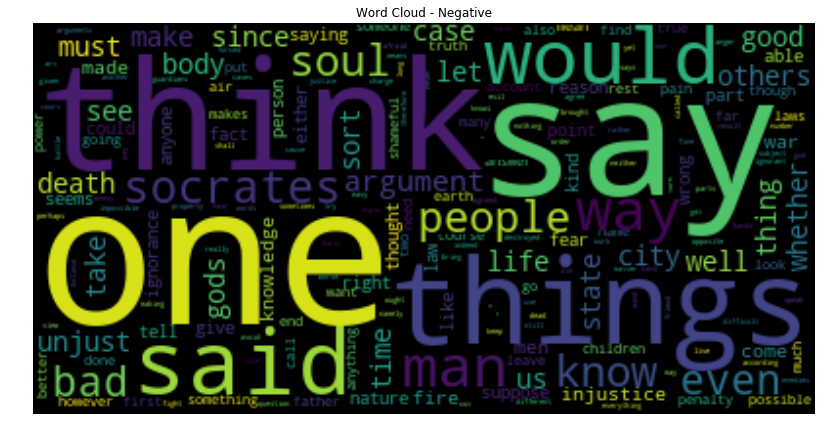

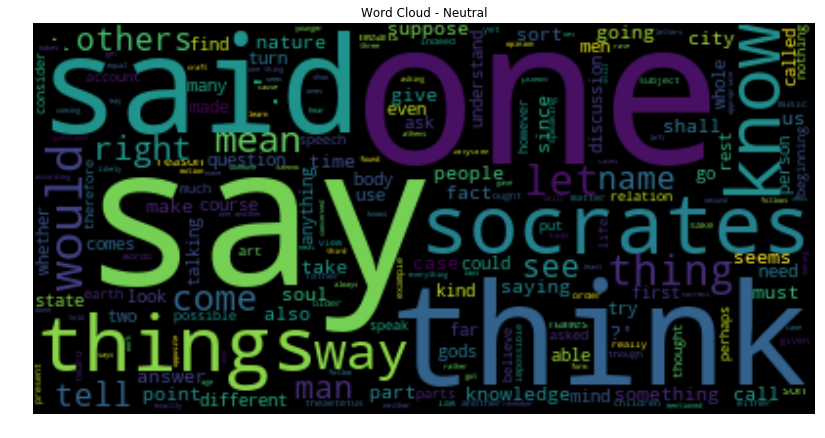

In [19]:
draw_cloud(key_dict['plato'])

## aristotle

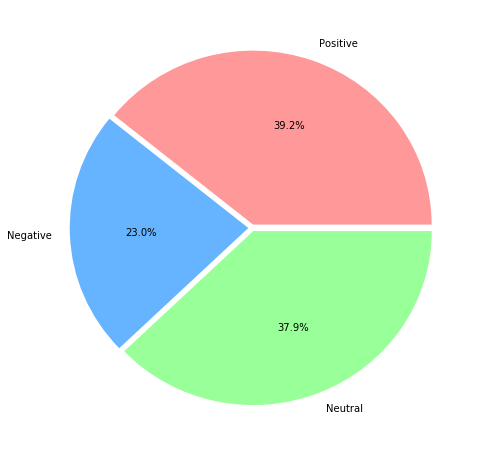

In [20]:
draw_pie('aristotle')

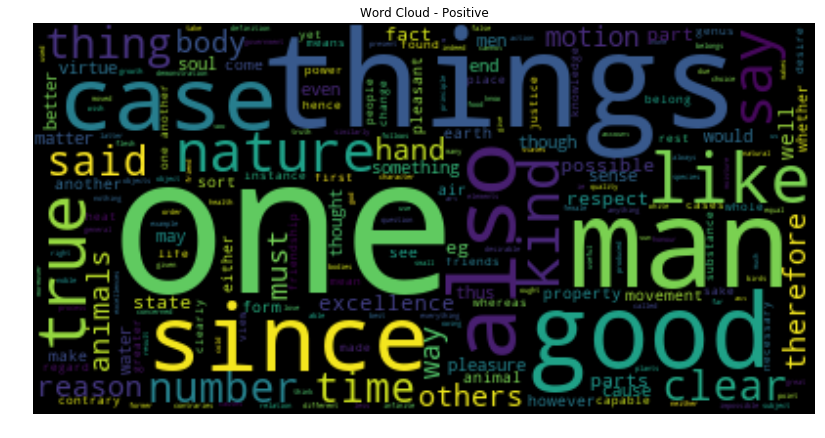

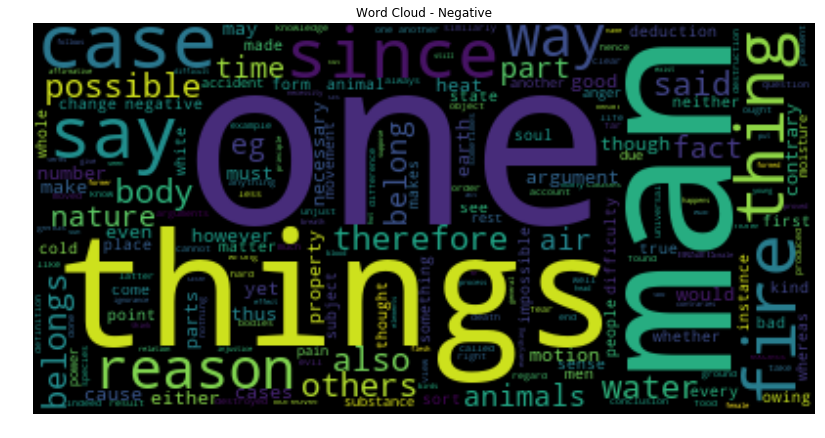

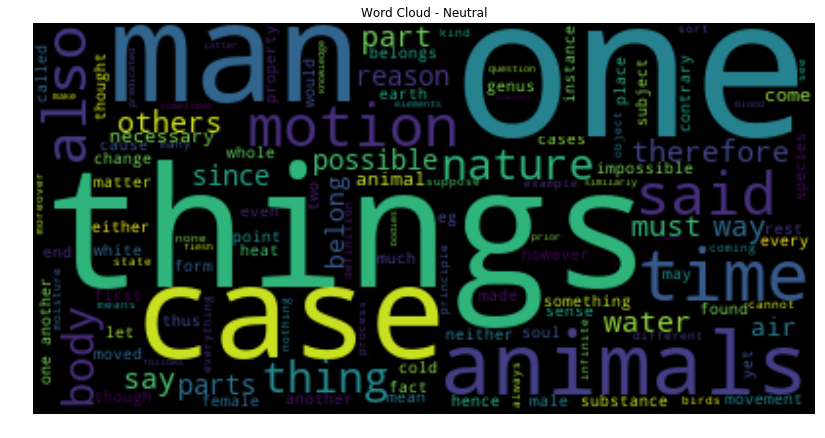

In [21]:
draw_cloud(key_dict['aristotle'])

## empiricism

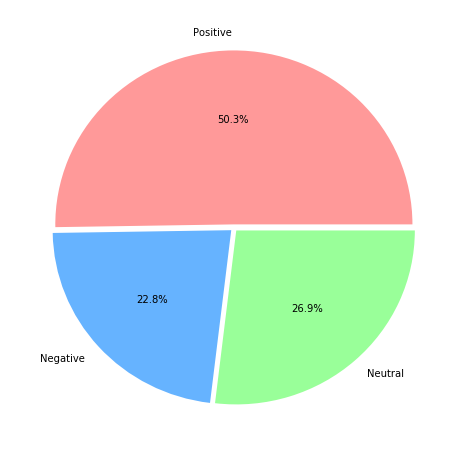

In [22]:
draw_pie('empiricism')

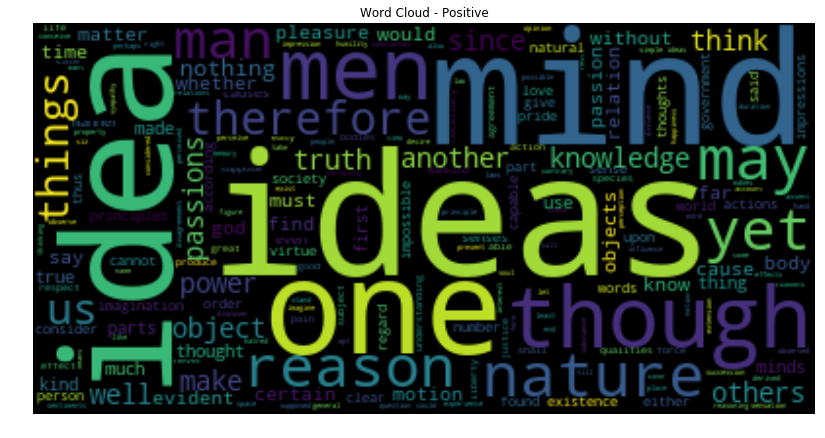

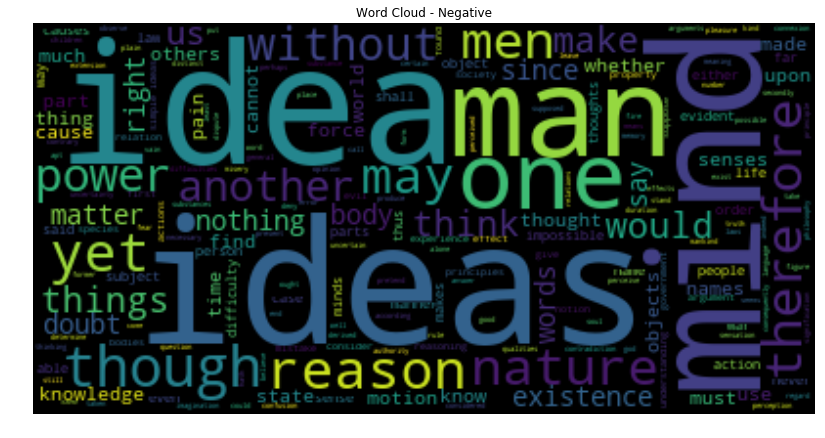

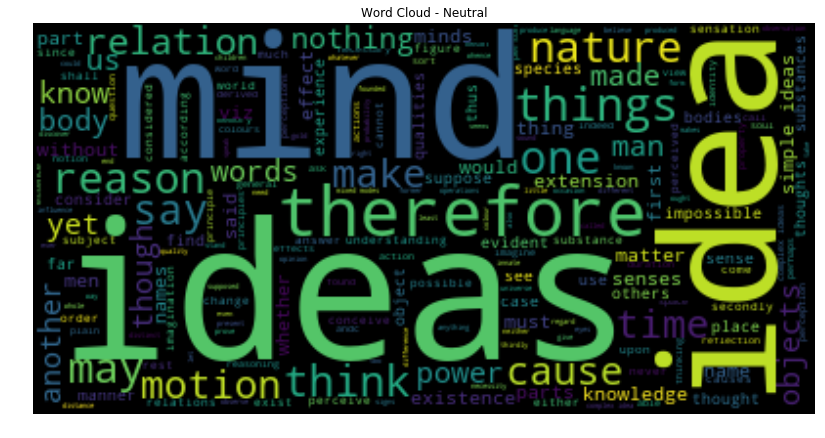

In [23]:
draw_cloud(key_dict['empiricism'])

# rationalism

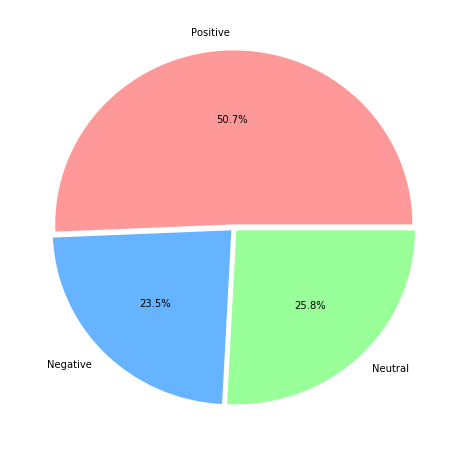

In [24]:
draw_pie('rationalism')

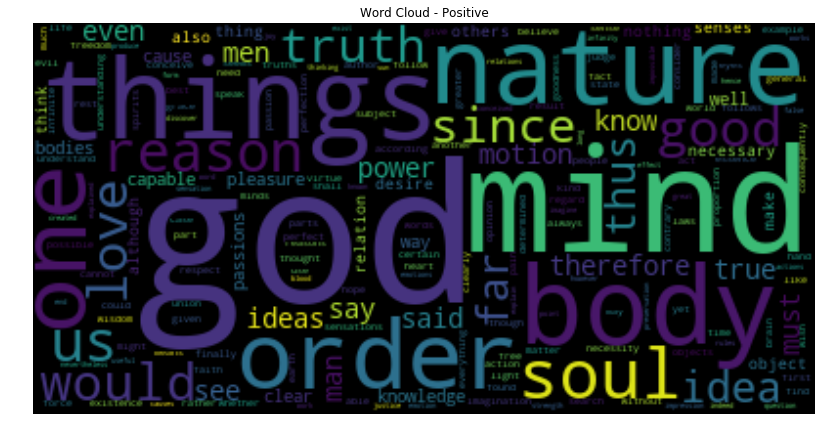

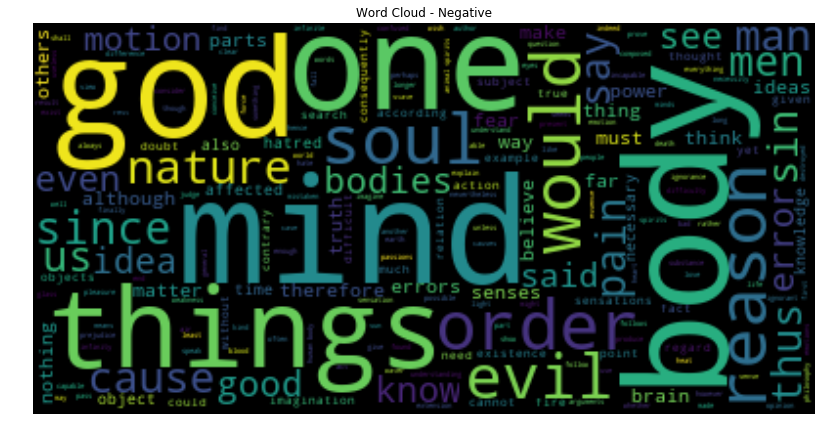

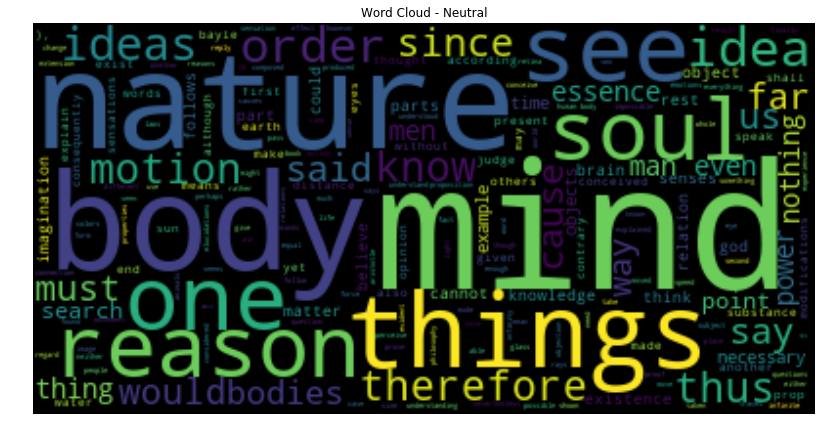

In [25]:
draw_cloud(key_dict['rationalism'])

## analytic

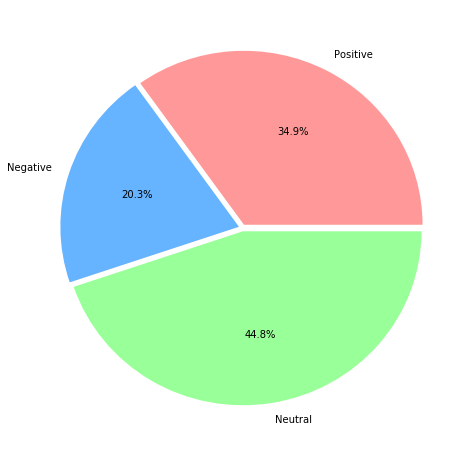

In [26]:
draw_pie('analytic')

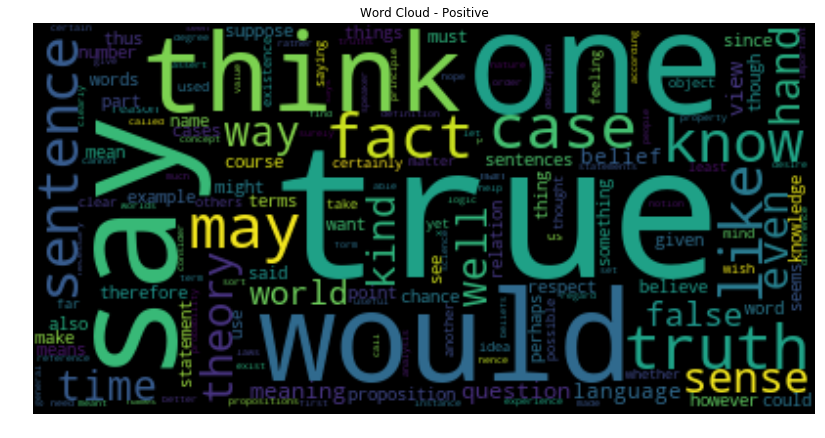

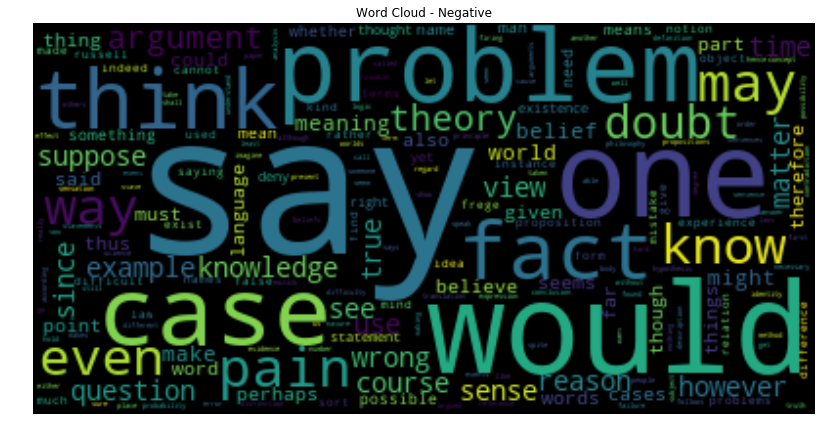

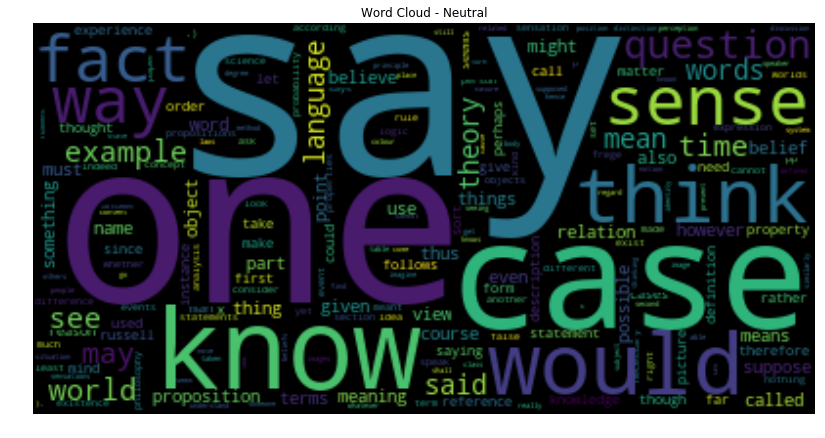

In [27]:
draw_cloud(key_dict['analytic'])

## continental

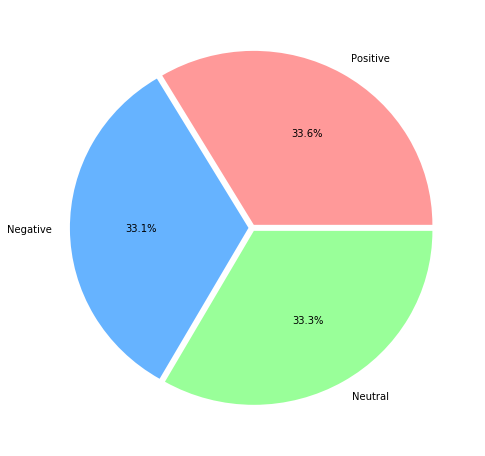

In [28]:
draw_pie('continental')

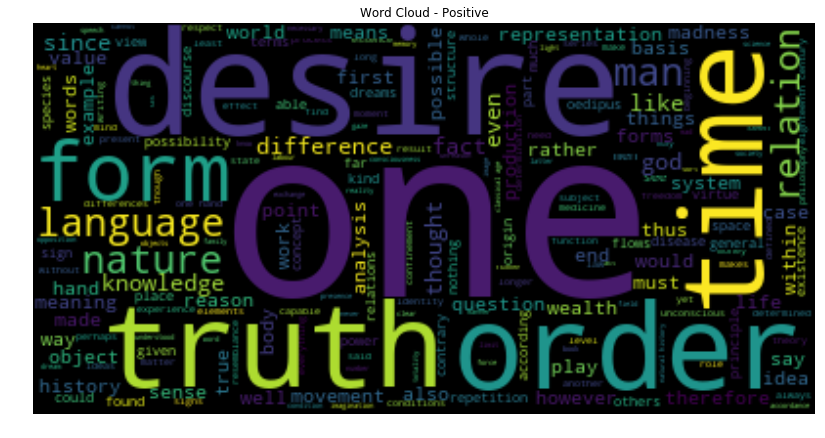

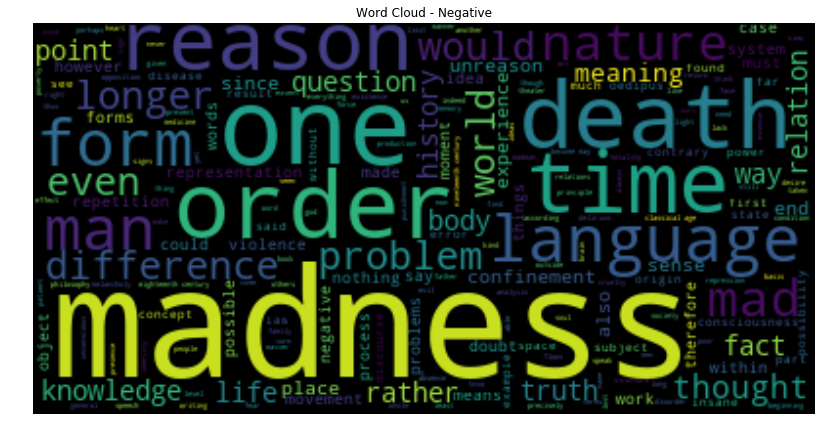

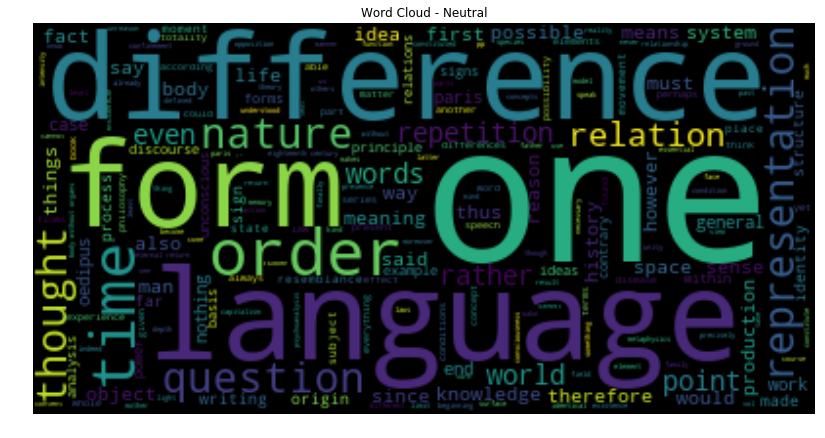

In [29]:
draw_cloud(key_dict['continental'])

## phenomenology

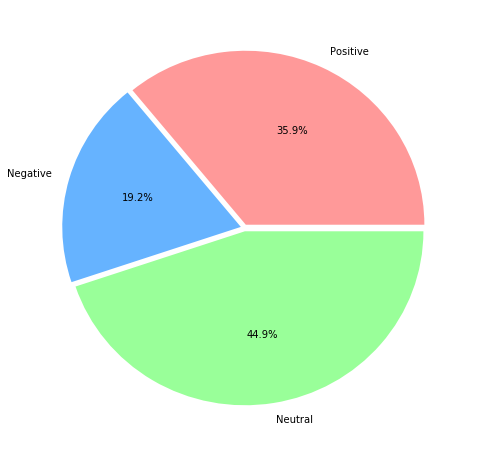

In [30]:
draw_pie('phenomenology')

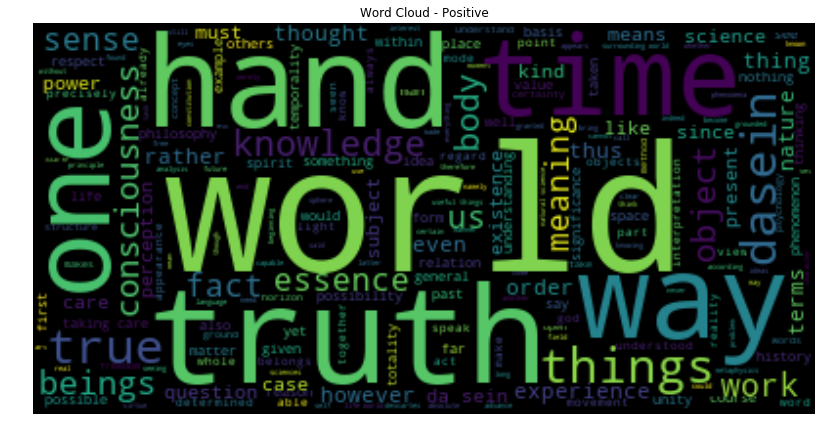

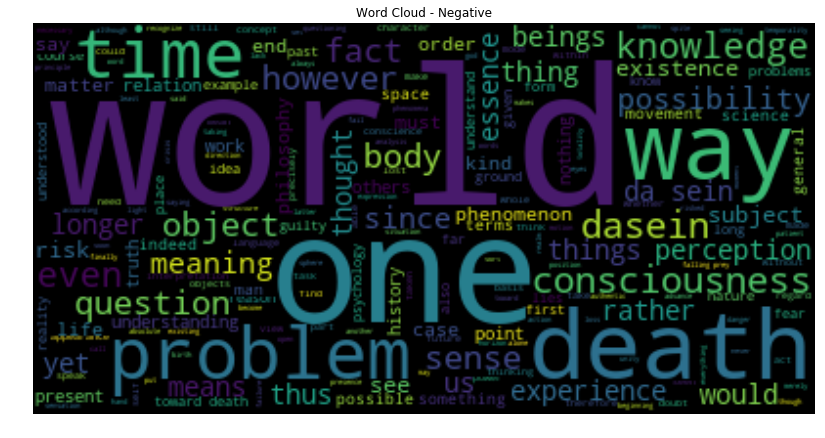

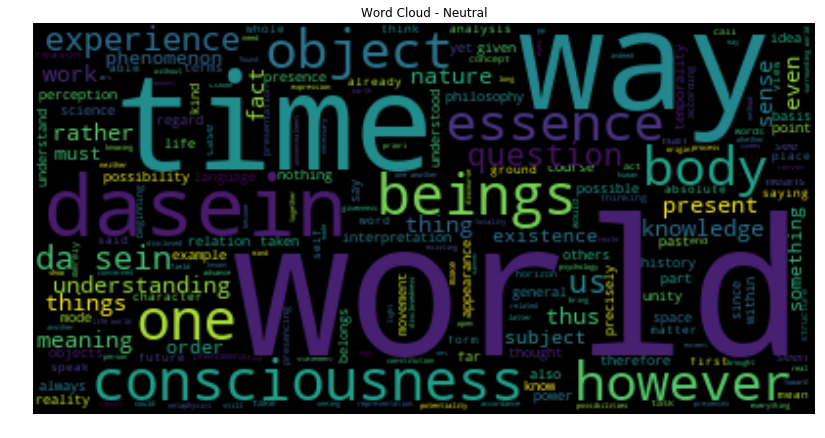

In [31]:
draw_cloud(key_dict['phenomenology'])

## german_idealism

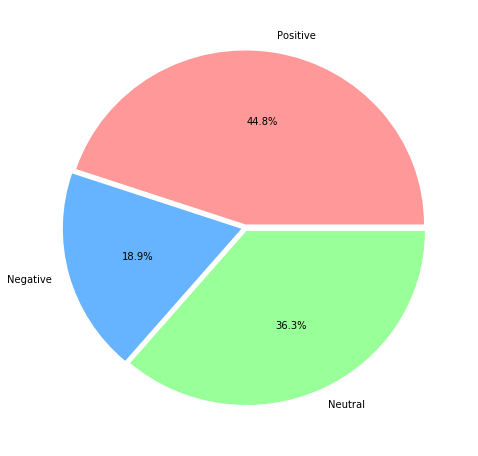

In [32]:
draw_pie('german_idealism')

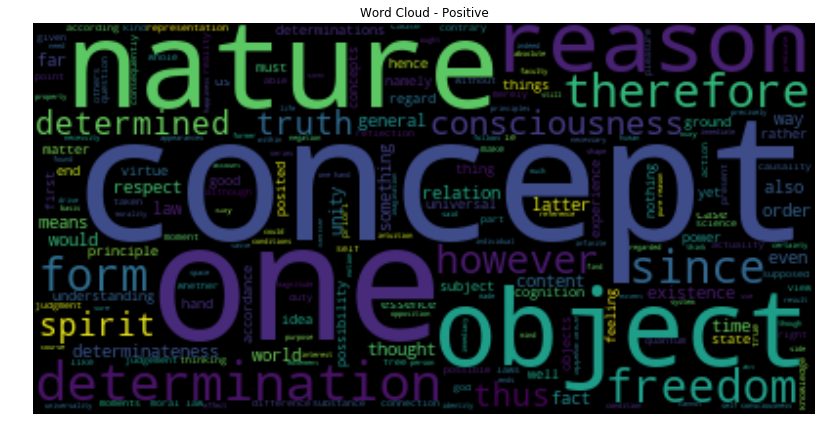

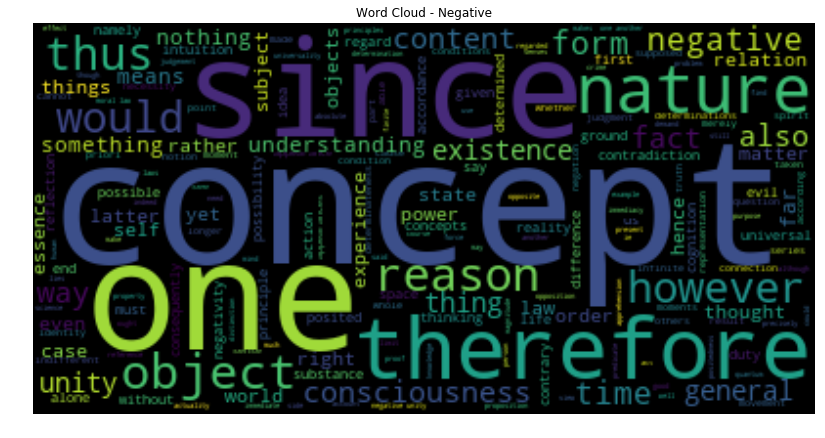

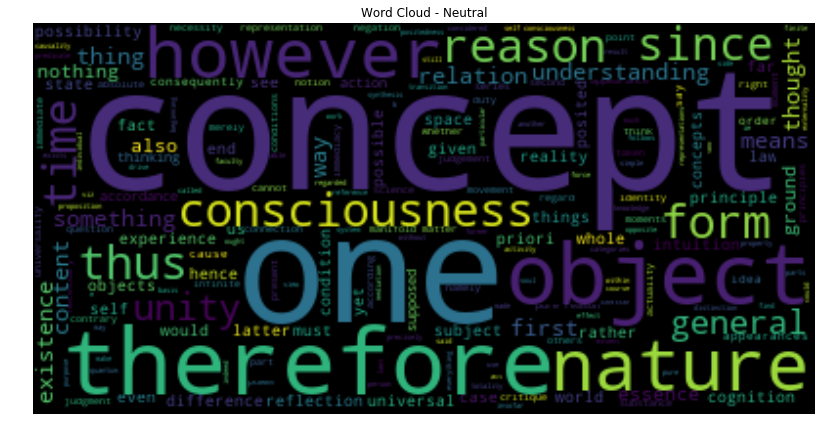

In [33]:
draw_cloud(key_dict['german_idealism'])

## communism

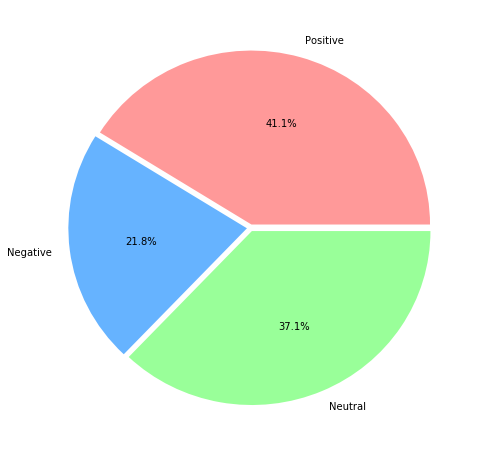

In [34]:
draw_pie('communism')

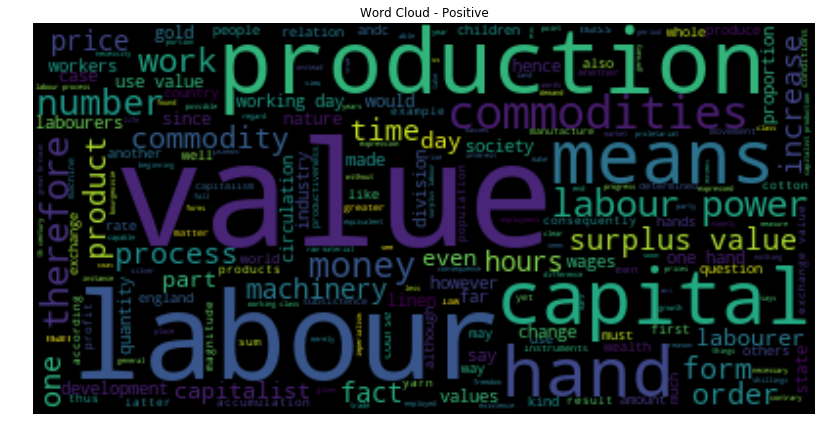

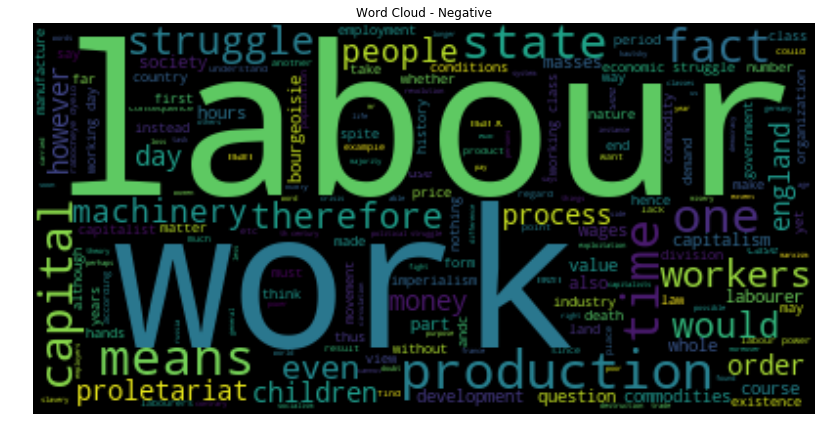

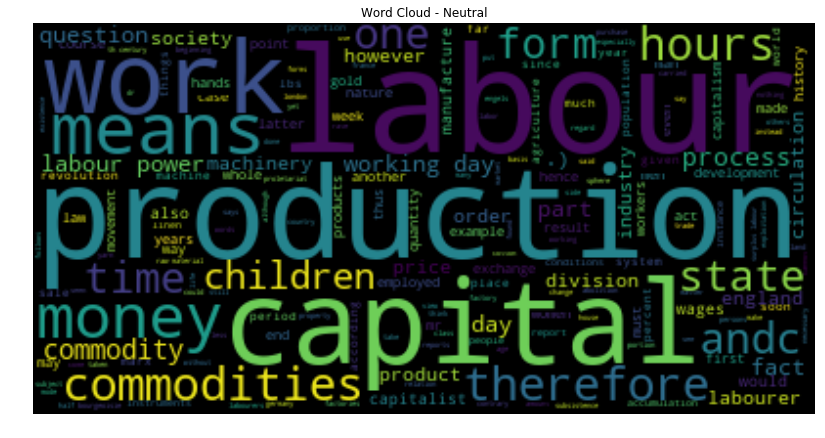

In [35]:
draw_cloud(key_dict['communism'])

## capitalism

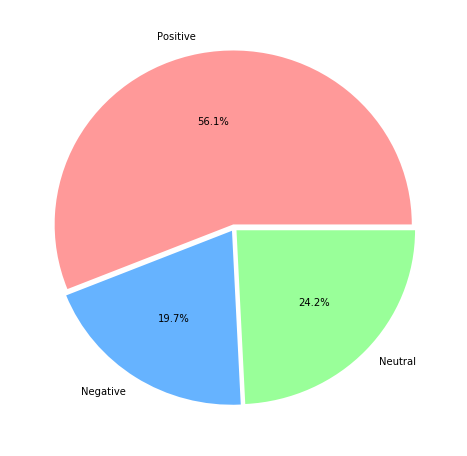

In [36]:
draw_pie('capitalism')

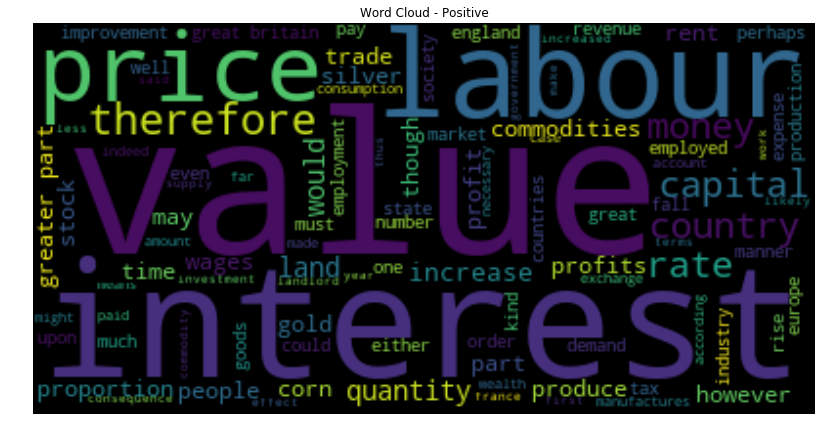

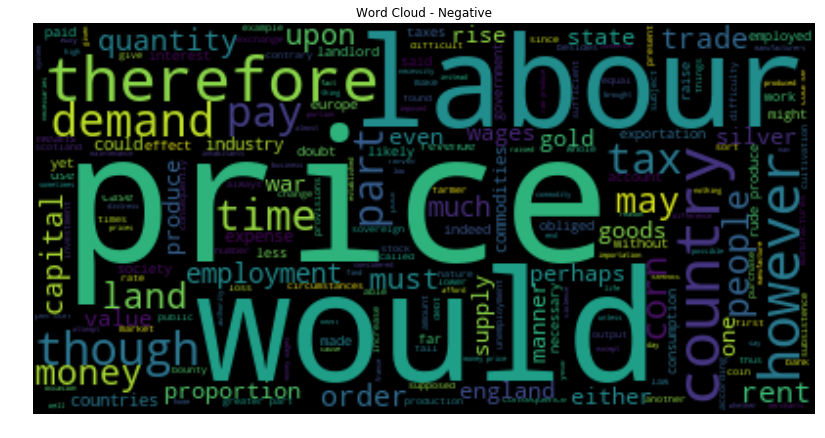

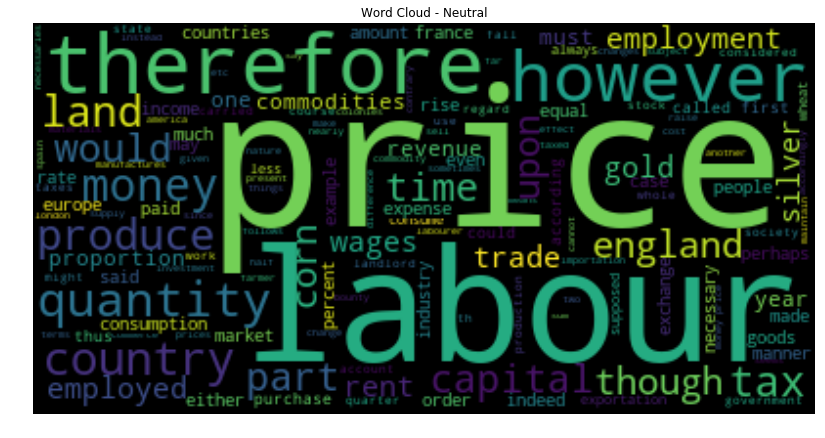

In [37]:
draw_cloud(key_dict['capitalism'])

## stoicism

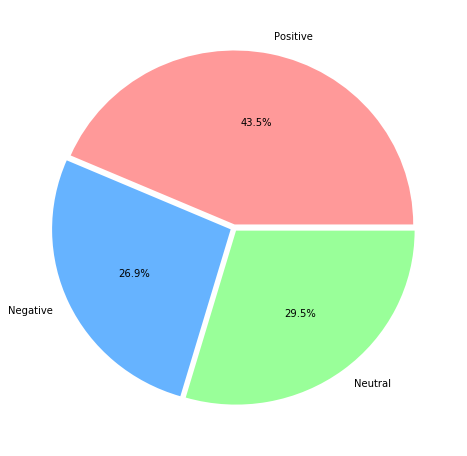

In [38]:
draw_pie('stoicism')

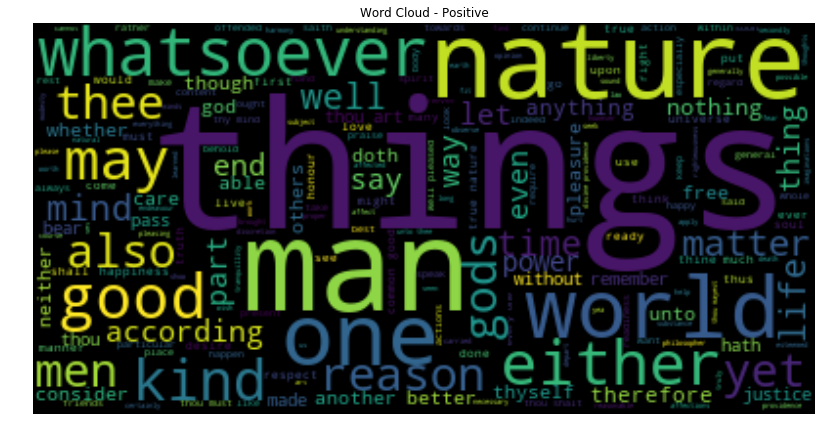

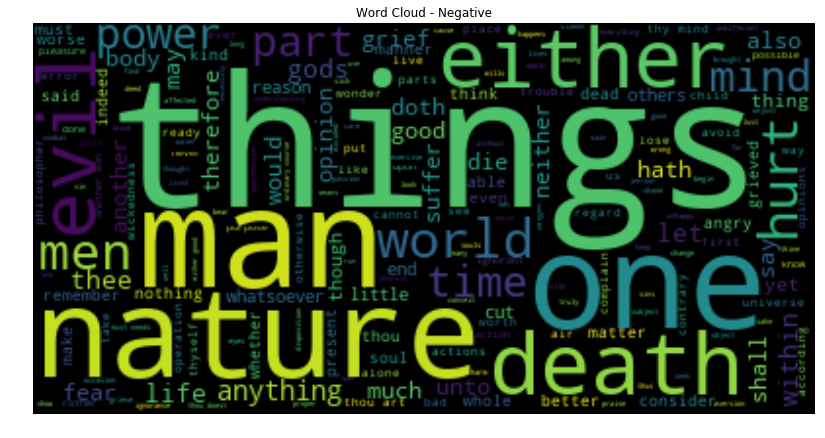

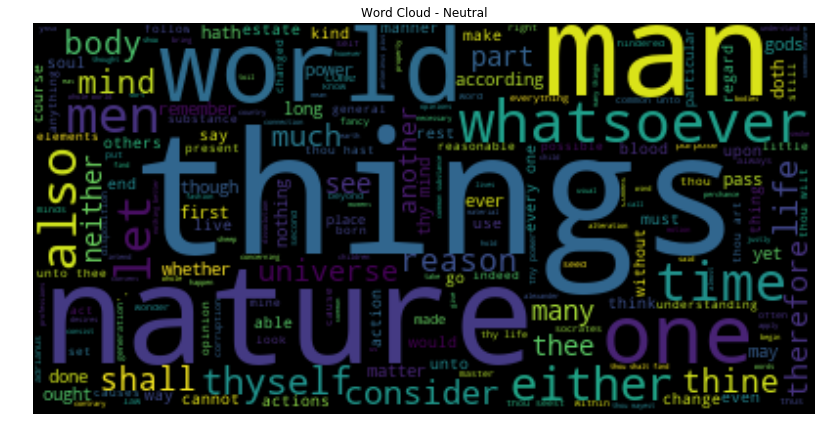

In [39]:
draw_cloud(key_dict['stoicism'])

## nietzsche

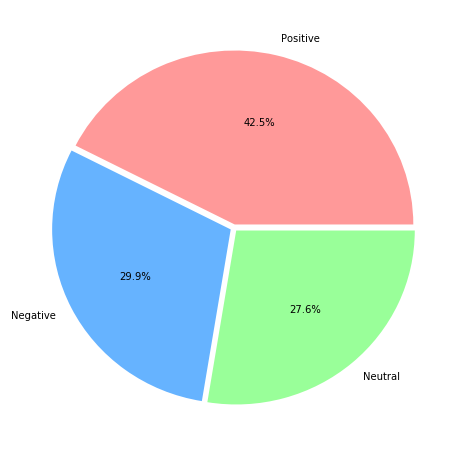

In [40]:
draw_pie('nietzsche')

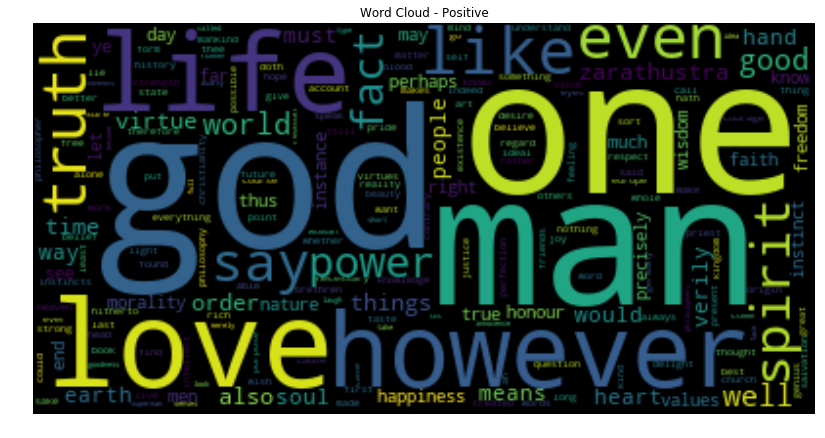

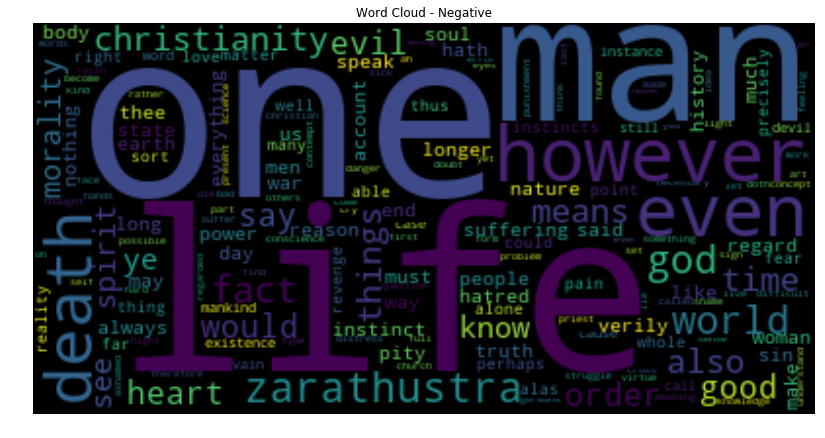

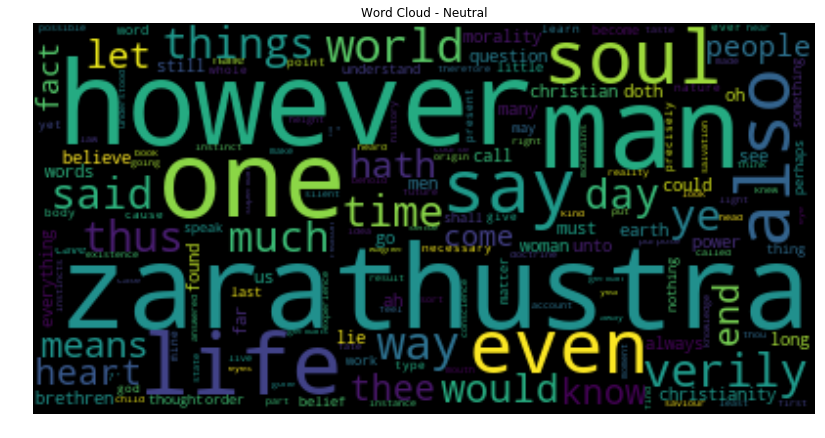

In [41]:
draw_cloud(key_dict['nietzsche'])

## feminism 

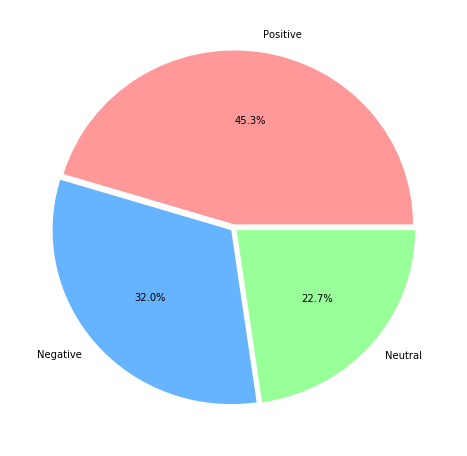

In [42]:
draw_pie('feminism')

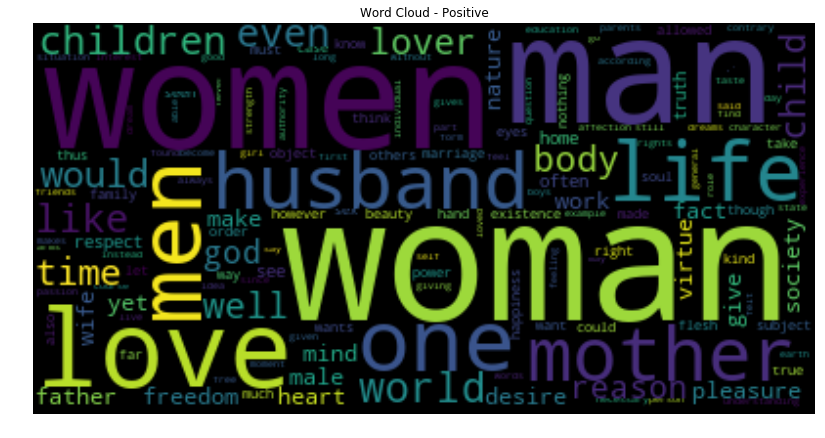

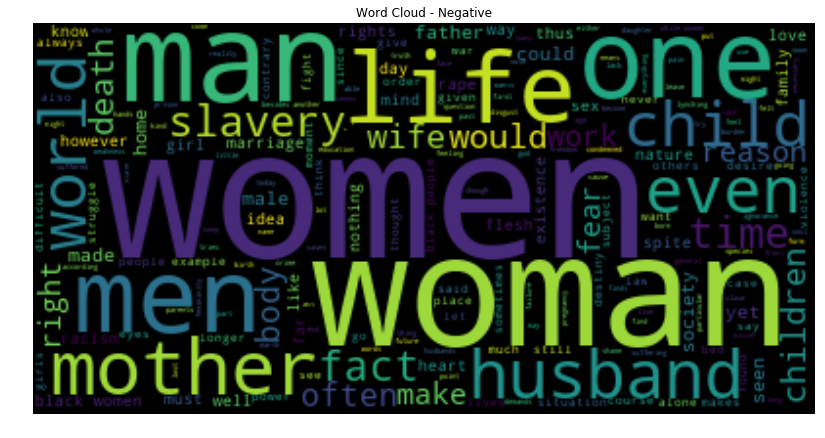

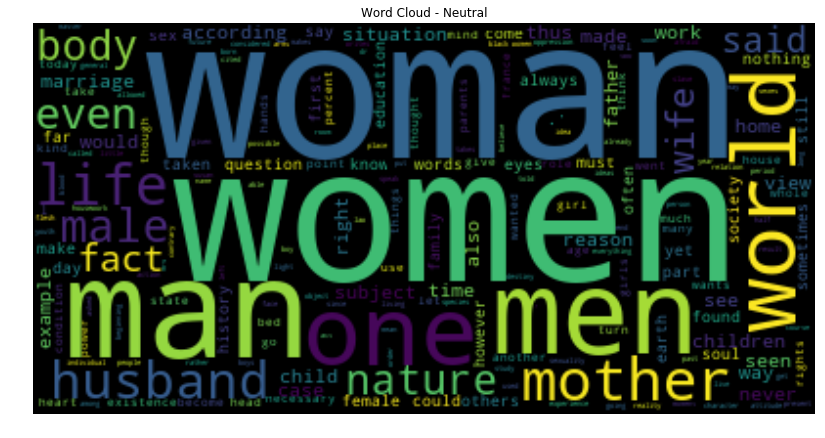

In [43]:
draw_cloud(key_dict['feminism'])

## Conlusion

By looking at the pie chart and the word cloud for each school, I am able to see each school's attitude on several topics. These results are helpful to answer the scientific question: which material talks about my topic and supporting my opinion. For example, if I am looking for texts that are related to capitalism, I should focus on school Capitalism since relative words do not appear in any other word cloud graph. Then it shows positive arguments are more likely to be found (56.1%). If I support capitalism, it is worth looking at those texts; if I am against capitalism, since the percentage of negative attitude is 19.7%, it is a little bit difficult to find relative texts and I might need to look at other kind of materials except those texts. Personally, the scientific question does help me inform the decision about what materials I should choose for my report. 

## Limitation

(1) The total number of texts for each school varies a lot (stoicism has relatively small amount of texts) and this might affect the results. <br>
(2) It can be seen that the word cloud graphs for each school are a little bit strange as the words "one", "say", "would" appear on the graphs. Those words do not bring me any information, but I still use default stopwords since I am not familiar with philosophy and I do not know whether they do matter in the philosophy area. The stopwords might need to be updated.